In [ ]:
from glob import glob
import os
import numpy as np
import cv2
from sklearn.metrics import roc_curve, precision_recall_curve, auc, f1_score
from keras.datasets import mnist, fashion_mnist, cifar100, cifar10
from keras.backend import cast_to_floatx

In [ ]:
from keras.models import Model
from keras.layers import Input, Add, Activation, Dropout, Flatten, Dense
from keras.layers.convolutional import Convolution2D, MaxPooling2D, AveragePooling2D
#from keras.layers.normalization import BatchNormalization
from keras.layers.normalization.batch_normalization_v1 import BatchNormalization
from keras.regularizers import l2
from keras import backend as K
import random

random.seed(0)
weight_decay = 0.0005

In [ ]:
import abc
import itertools
import numpy as np
from keras.preprocessing.image import apply_affine_transform

## **Load and Preprocessing the data**

In [ ]:
def resize_and_crop_image(input_file, output_side_length, greyscale=False):
    img = cv2.imread(input_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB if not greyscale else cv2.COLOR_BGR2GRAY)
    height, width = img.shape[:2]
    new_height = output_side_length
    new_width = output_side_length
    if height > width:
        new_height = int(output_side_length * height / width)
    else:
        new_width = int(output_side_length * width / height)
    resized_img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_AREA)
    height_offset = (new_height - output_side_length) // 2
    width_offset = (new_width - output_side_length) // 2
    cropped_img = resized_img[height_offset:height_offset + output_side_length,
                              width_offset:width_offset + output_side_length]
    assert cropped_img.shape[:2] == (output_side_length, output_side_length)
    return cropped_img

In [ ]:
def normalize_minus1_1(data):
    return 2*(data/255.) - 1

In [ ]:
def get_channels_axis():
  import keras
  idf = keras.backend.image_data_format()
  if idf == 'channels_first':
      return 1
  assert idf == 'channels_last'
  return 3

In [ ]:
def load_fashion_mnist():
    (X_train, y_train), (X_test, y_test) = fashion_mnist.load_data()
    X_train = normalize_minus1_1(cast_to_floatx(np.pad(X_train, ((0, 0), (2, 2), (2, 2)), 'constant')))
    X_train = np.expand_dims(X_train, axis=get_channels_axis())
    X_test = normalize_minus1_1(cast_to_floatx(np.pad(X_test, ((0, 0), (2, 2), (2, 2)), 'constant')))
    X_test = np.expand_dims(X_test, axis=get_channels_axis())
    return (X_train, y_train), (X_test, y_test)

In [ ]:
def load_cifar10():
    (X_train, y_train), (X_test, y_test) = cifar10.load_data()
    X_train = normalize_minus1_1(cast_to_floatx(X_train))
    X_test = normalize_minus1_1(cast_to_floatx(X_test))
    return (X_train, y_train), (X_test, y_test)

## **Saving the results**

In [ ]:
def roc_pr_curve_data(scores, labels):
    scores = scores.flatten()
    labels = labels.flatten()

    scores_pos = scores[labels == 1]
    scores_neg = scores[labels != 1]

    truth = np.concatenate((np.zeros_like(scores_neg), np.ones_like(scores_pos)))
    preds = np.concatenate((scores_neg, scores_pos))
    fpr, tpr, roc_thresholds = roc_curve(truth, preds)
    roc_auc = auc(fpr, tpr)
    print("roc_auc",roc_auc)

    # pr curve where "normal" is the positive class
    precision_norm, recall_norm, pr_thresholds_norm = precision_recall_curve(truth, preds)
    pr_auc_norm = auc(recall_norm, precision_norm)
    print("pr_auc_norm where normal is the positive class",pr_auc_norm)

    # pr curve where "anomaly" is the positive class
    precision_anom, recall_anom, pr_thresholds_anom = precision_recall_curve(truth, -preds, pos_label=0)
    pr_auc_anom = auc(recall_anom, precision_anom)
    print("pr_auc_norm where anomaly is the positive class",pr_auc_anom)

In [ ]:
def get_class_name_from_index(index, dataset_name):
    ind_to_name = {
        'fashion-mnist': ('t-shirt', 'trouser', 'pullover', 'dress', 'coat', 'sandal', 'shirt', 'sneaker', 'bag',
                          'ankle-boot'),
    }

    return ind_to_name[dataset_name][index]

## **Transformations**

In [ ]:
class AffineTransformation(object):
    def __init__(self, flip, tx, ty, k_90_rotate):
        self.flip = flip
        self.tx = tx
        self.ty = ty
        self.k_90_rotate = k_90_rotate

    def __call__(self, x):
        res_x = x
        if self.flip:
            res_x = np.fliplr(res_x)
        if self.tx != 0 or self.ty != 0:
            res_x = apply_affine_transform(res_x, tx=self.tx, ty=self.ty,row_axis=0,
    col_axis=1, channel_axis=2, fill_mode='reflect')
        if self.k_90_rotate != 0:
            res_x = np.rot90(res_x, self.k_90_rotate)

        return res_x

In [ ]:
class AbstractTransformer(abc.ABC):
    def __init__(self):
        self._transformation_list = None
        self._create_transformation_list()

    @property
    def n_transforms(self):
        return len(self._transformation_list)

    @abc.abstractmethod
    def _create_transformation_list(self):
        return

    def transform_batch(self, x_batch, t_inds):
        assert len(x_batch) == len(t_inds)

        transformed_batch = x_batch.copy()
        for i, t_ind in enumerate(t_inds):
            transformed_batch[i] = self._transformation_list[t_ind](transformed_batch[i])
        return transformed_batch

In [ ]:
class Transformer(AbstractTransformer):
    def __init__(self, translation_x=8, translation_y=8):
        self.max_tx = translation_x
        self.max_ty = translation_y
        super().__init__()

    def _create_transformation_list(self):
        transformation_list = []
        for is_flip, tx, ty, k_rotate in itertools.product((False, True),
                                                           (0, -self.max_tx, self.max_tx),
                                                           (0, -self.max_ty, self.max_ty),
                                                           range(4)):
            transformation = AffineTransformation(is_flip, tx, ty, k_rotate)
            transformation_list.append(transformation)

        self._transformation_list = transformation_list

In [ ]:
class SimpleTransformer(AbstractTransformer):
    def _create_transformation_list(self):
        transformation_list = []
        for is_flip, k_rotate in itertools.product((False, True),
                                                    range(4)):
            transformation = AffineTransformation(is_flip, 0, 0, k_rotate)
            transformation_list.append(transformation)

        self._transformation_list = transformation_list

## **The Model: Wide Residual Network**

In [ ]:
def initial_conv(input):
    x = Convolution2D(16, (3, 3), padding='same', kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(input)

    channel_axis = 1 if K.image_data_format() == "channels_first" else -1

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(x)
    x = Activation('relu')(x)
    return x


def expand_conv(init, base, k, strides=(1, 1)):
    x = Convolution2D(base * k, (3, 3), padding='same', strides=strides, kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(init)

    channel_axis = 1 if K.image_data_format() == "channels_first" else -1

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(x)
    x = Activation('relu')(x)

    x = Convolution2D(base * k, (3, 3), padding='same', kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(x)

    skip = Convolution2D(base * k, (1, 1), padding='same', strides=strides, kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(init)

    m = Add()([x, skip])

    return m


def conv1_block(input, k=1, dropout=0.0):
    init = input

    channel_axis = 1 if K.image_data_format() == "channels_first" else -1

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(input)
    x = Activation('relu')(x)
    x = Convolution2D(16 * k, (3, 3), padding='same', kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(x)

    if dropout > 0.0: x = Dropout(dropout)(x)

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(x)
    x = Activation('relu')(x)
    x = Convolution2D(16 * k, (3, 3), padding='same', kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(x)

    m = Add()([init, x])
    return m

def conv2_block(input, k=1, dropout=0.0):
    init = input

    channel_axis = 1 if K.image_data_format() == "th" else -1

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(input)
    x = Activation('relu')(x)
    x = Convolution2D(32 * k, (3, 3), padding='same', kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(x)

    if dropout > 0.0: x = Dropout(dropout)(x)

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(x)
    x = Activation('relu')(x)
    x = Convolution2D(32 * k, (3, 3), padding='same', kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(x)

    m = Add()([init, x])
    return m

def conv3_block(input, k=1, dropout=0.0):
    init = input

    channel_axis = 1 if K.image_data_format() == "th" else -1

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(input)
    x = Activation('relu')(x)
    x = Convolution2D(64 * k, (3, 3), padding='same', kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(x)

    if dropout > 0.0: x = Dropout(dropout)(x)

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(x)
    x = Activation('relu')(x)
    x = Convolution2D(64 * k, (3, 3), padding='same', kernel_initializer='he_normal',
                      kernel_regularizer=l2(weight_decay),
                      use_bias=False)(x)

    m = Add()([init, x])
    return m

def create_wide_residual_network(input_dim, nb_classes=100, N=2, k=1, dropout=0.0, verbose=1):
    channel_axis = 1 if K.image_data_format() == "channels_first" else -1

    ip = Input(shape=input_dim)

    x = initial_conv(ip)
    nb_conv = 4

    x = expand_conv(x, 16, k)
    nb_conv += 2

    for i in range(N - 1):
        x = conv1_block(x, k, dropout)
        nb_conv += 2

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(x)
    x = Activation('relu')(x)

    x = expand_conv(x, 32, k, strides=(2, 2))
    nb_conv += 2

    for i in range(N - 1):
        x = conv2_block(x, k, dropout)
        nb_conv += 2

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(x)
    x = Activation('relu')(x)

    x = expand_conv(x, 64, k, strides=(2, 2))
    nb_conv += 2

    for i in range(N - 1):
        x = conv3_block(x, k, dropout)
        nb_conv += 2

    x = BatchNormalization(axis=channel_axis, momentum=0.1, epsilon=1e-5, gamma_initializer='uniform')(x)
    x = Activation('relu')(x)

    x = AveragePooling2D((8, 8))(x)
    x = Flatten()(x)

    x = Dense(nb_classes, kernel_regularizer=l2(weight_decay), activation='softmax')(x)

    model = Model(ip, x)

    if verbose: print("Wide Residual Network-%d-%d created." % (nb_conv, k))
    return model

## **Experiments**

In [ ]:
import os
import csv
from collections import defaultdict
from glob import glob
from datetime import datetime
from multiprocessing import Manager, freeze_support, Process
import numpy as np
import scipy.stats
from scipy.special import psi, polygamma
from sklearn.metrics import roc_auc_score
from sklearn.svm import OneClassSVM
from sklearn.model_selection import ParameterGrid
from joblib import Parallel, delayed
from keras.models import Model, Sequential
from tensorflow.keras.layers import Input
from keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical

In [ ]:
import tensorflow as tf
import tensorflow.keras.backend as K
from glob import glob
import os
import numpy as np
import cv2
from sklearn.metrics import roc_curve, precision_recall_curve, auc
from keras.datasets import mnist, fashion_mnist, cifar100, cifar10
from keras.backend import cast_to_floatx
from tqdm.notebook import tqdm

In [ ]:
def training_class_fashion_mnist(x_train,y_train,x_test,y_test,single_class_ind):
    print('training class:',single_class_ind)

    x_train = x_train[:10000]
    y_train =  y_train[:10000]
    x_test =  x_test[:1000]
    y_test =  y_test[:1000]
    
    transformer = Transformer(8, 8)
    n, k = (2, 8)
    mdl = create_wide_residual_network(x_train.shape[1:], transformer.n_transforms, n, k)
    mdl.compile('adam',
                'categorical_crossentropy',
                ['acc'])

    x_train_task = x_train[y_train.flatten() == single_class_ind]
    transformations_inds = np.tile(np.arange(transformer.n_transforms), len(x_train_task))
    print('Start of the proposed transformation')
    x_train_task_transformed = transformer.transform_batch(np.repeat(x_train_task, transformer.n_transforms, axis=0),
                                                           transformations_inds)
    print('End of the proposed transformation')
    batch_size = 128
    print('Start of the training')
    mdl.fit(x=x_train_task_transformed, y=to_categorical(transformations_inds),
            batch_size=batch_size, epochs= 5 
            )
    print('End of the training')
    observed_data = x_train_task
    observed_dirichlet = mdl.predict(transformer.transform_batch(observed_data, [0] * len(observed_data)),
                                         batch_size=128)
    return observed_dirichlet

In [ ]:
print('Fashion MNIST Data Set')
(x_train, y_train), (x_test, y_test) = load_fashion_mnist()
observed_dirichlet_0 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,0)
observed_dirichlet_1 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,1)
observed_dirichlet_2 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,2)
observed_dirichlet_3 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,3)
observed_dirichlet_4 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,4)
observed_dirichlet_5 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,5)
observed_dirichlet_6 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,6)
observed_dirichlet_7 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,7)
observed_dirichlet_8 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,8)
observed_dirichlet_9 = training_class_fashion_mnist(x_train,y_train,x_test,y_test,9)

Fashion MNIST Data Set
4422102/4422102 [==============================] - 0s 0us/step
training class: 0
Wide Residual Network-16-8 created.
Start of the proposed transformation
End of the proposed transformation
Start of the training
Epoch 1/5
530/530 [==============================] - 112s 188ms/step - loss: 1.8344 - acc: 0.5353
Epoch 2/5
530/530 [==============================] - 100s 189ms/step - loss: 0.8211 - acc: 0.7787
Epoch 3/5
530/530 [==============================] - 101s 191ms/step - loss: 0.5915 - acc: 0.8865
Epoch 4/5
530/530 [==============================] - 101s 192ms/step - loss: 0.4602 - acc: 0.9408
Epoch 5/5
530/530 [==============================] - 101s 191ms/step - loss: 0.3936 - acc: 0.9622
End of the training
8/8 [==============================] - 1s 112ms/step
training class: 1
Wide Residual Network-16-8 created.
Start of the proposed transformation
End of the proposed transformation
Start of the training
Epoch 1/5
578/578 [==============================] - 11

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

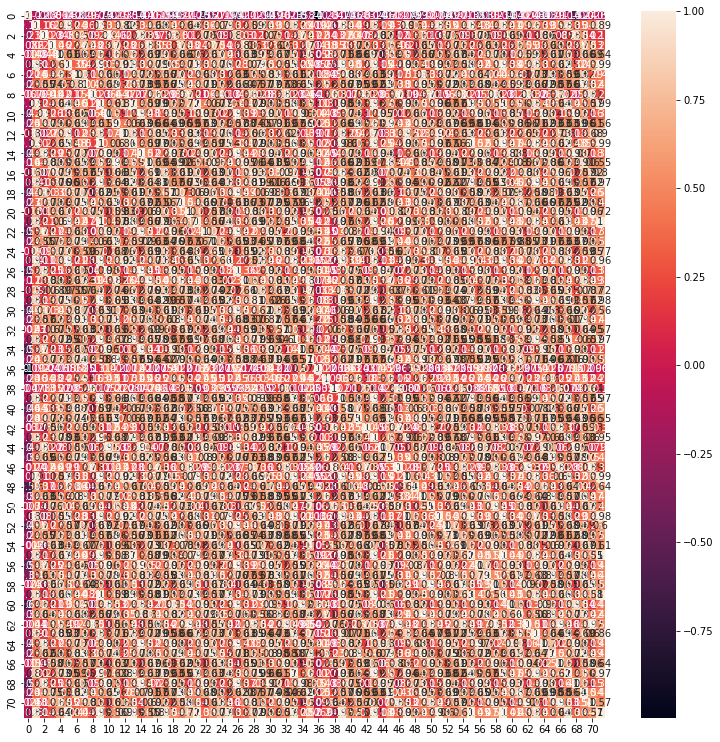

In [ ]:
df_0 = pd.DataFrame(observed_dirichlet_0)
corr_matrix_0 = df_0.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_0, annot=True)

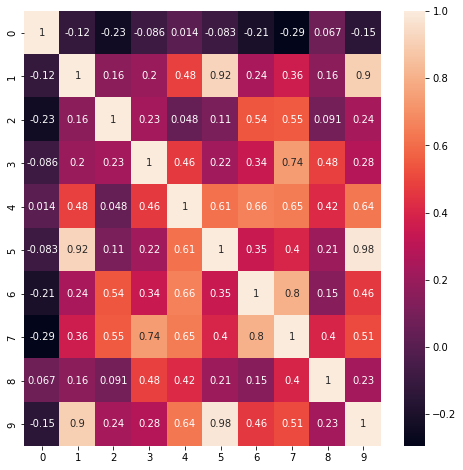

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_0 = corr_matrix_0.iloc[0:10,0:10]
sn.heatmap(corr_matrix_0, annot=True)
plt.show()

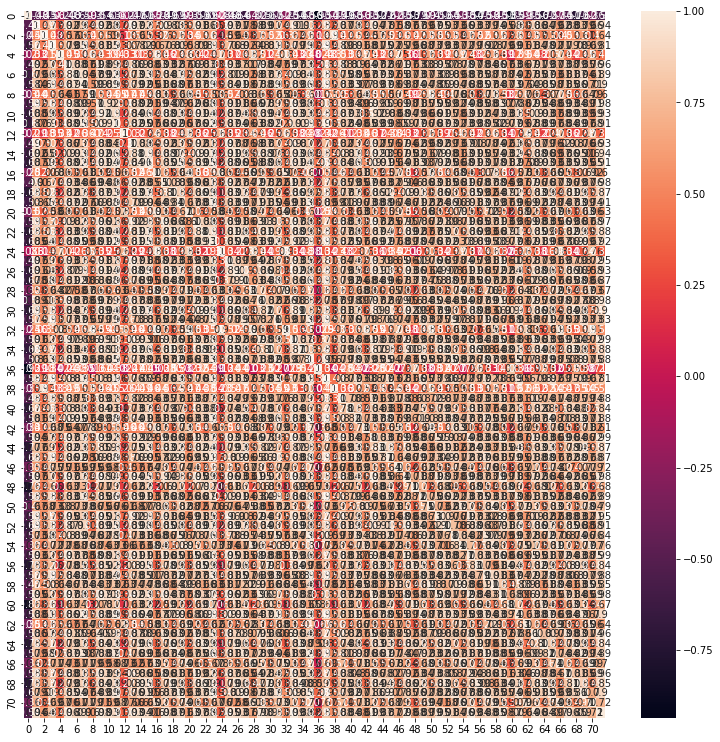

In [ ]:
df_1 = pd.DataFrame(observed_dirichlet_1)
corr_matrix_1 = df_1.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_1, annot=True)

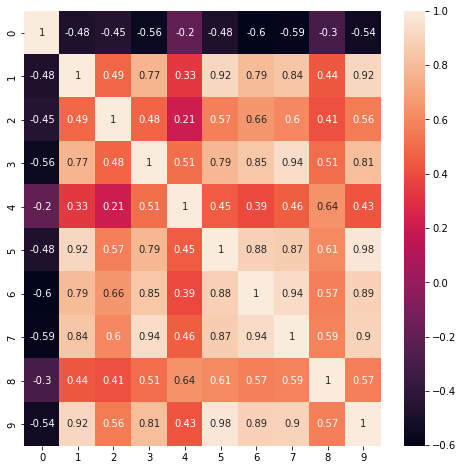

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_1 = corr_matrix_1.iloc[0:10,0:10]
sn.heatmap(corr_matrix_1, annot=True)
plt.show()

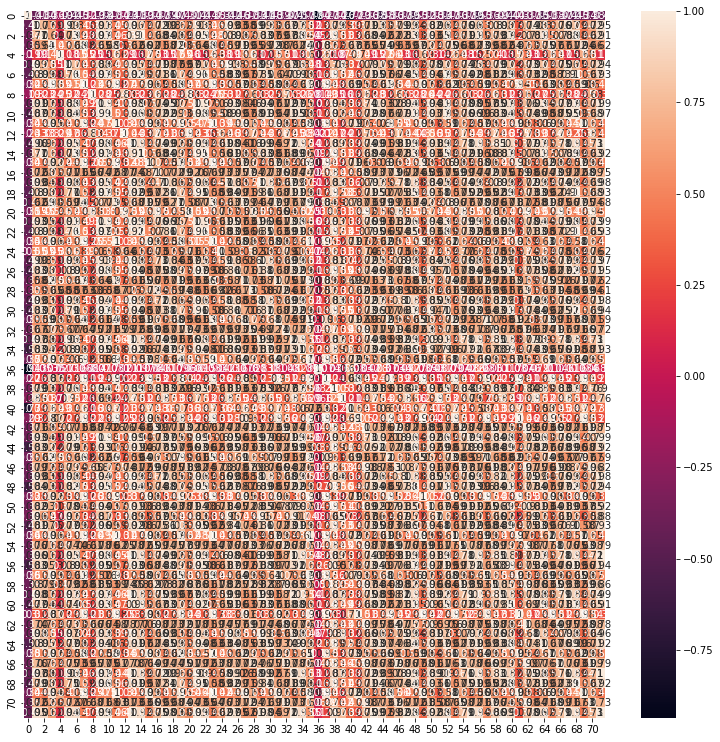

In [ ]:
df_2 = pd.DataFrame(observed_dirichlet_2)
corr_matrix_2 = df_2.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_2, annot=True)

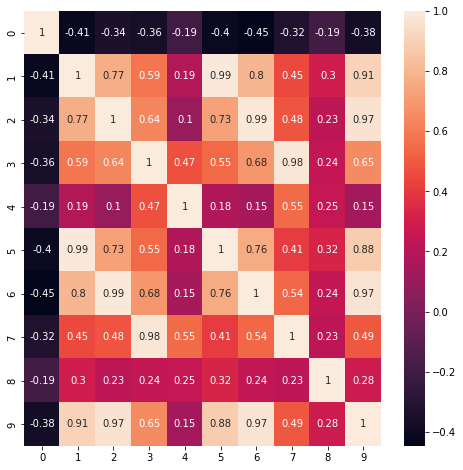

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_2 = corr_matrix_2.iloc[0:10,0:10]
sn.heatmap(corr_matrix_2, annot=True)
plt.show()

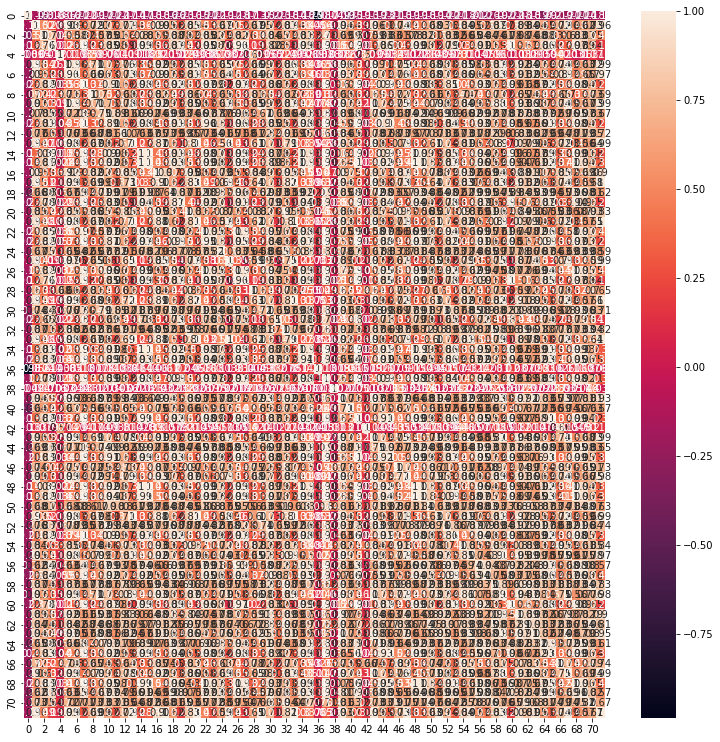

In [ ]:
df_3 = pd.DataFrame(observed_dirichlet_3)
corr_matrix_3 = df_3.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_3, annot=True)

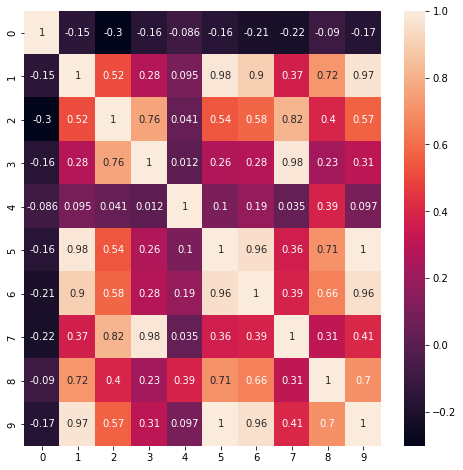

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_3 = corr_matrix_3.iloc[0:10,0:10]
sn.heatmap(corr_matrix_3, annot=True)
plt.show()

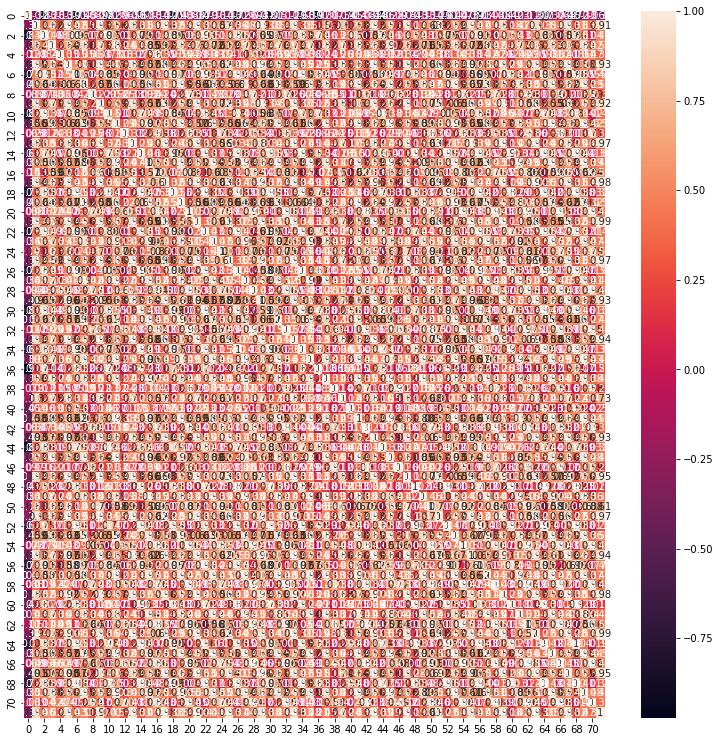

In [ ]:
df_4 = pd.DataFrame(observed_dirichlet_4)
corr_matrix_4 = df_4.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_4, annot=True)

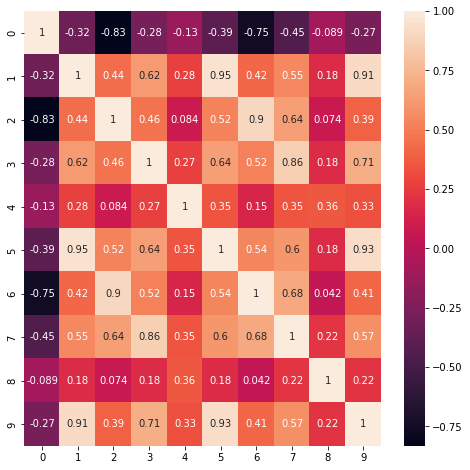

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_4 = corr_matrix_4.iloc[0:10,0:10]
sn.heatmap(corr_matrix_4, annot=True)
plt.show()

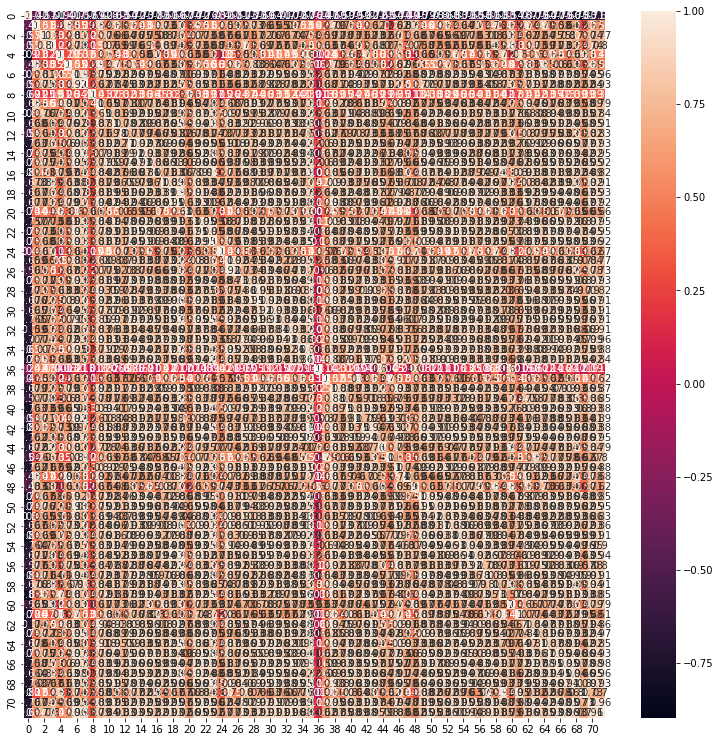

In [ ]:
df_5 = pd.DataFrame(observed_dirichlet_5)
corr_matrix_5 = df_5.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_5, annot=True)

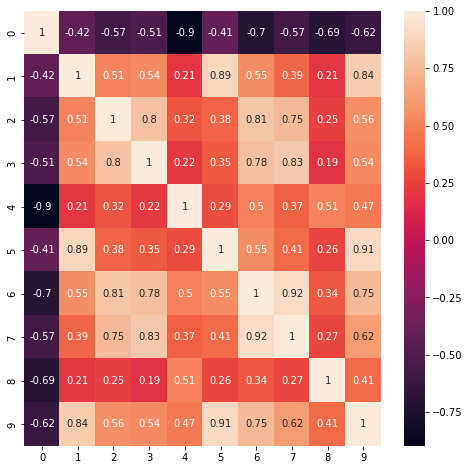

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_5 = corr_matrix_5.iloc[0:10,0:10]
sn.heatmap(corr_matrix_5, annot=True)
plt.show()

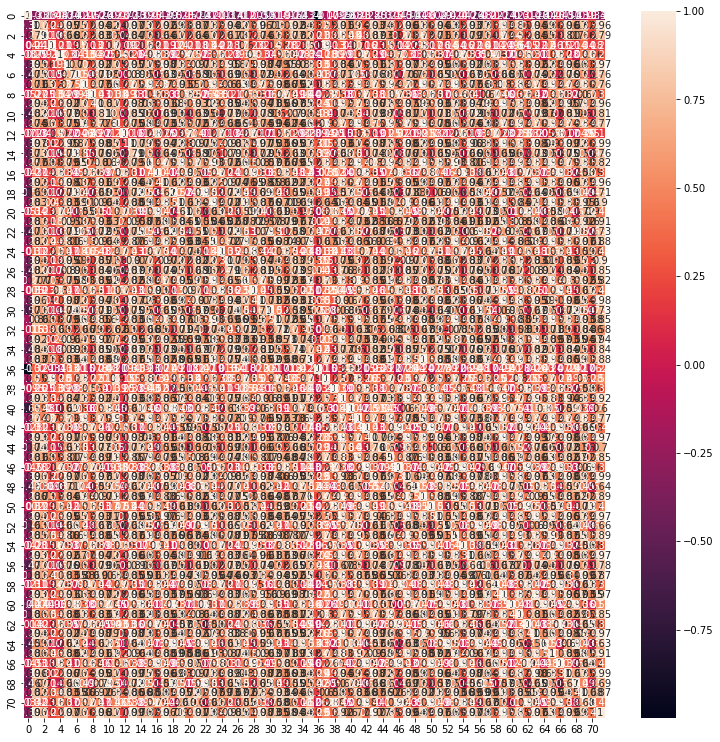

In [ ]:
df_6 = pd.DataFrame(observed_dirichlet_6)
corr_matrix_6 = df_6.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_6, annot=True)

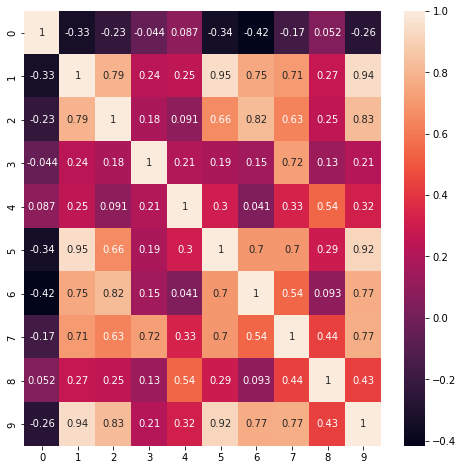

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_6 = corr_matrix_6.iloc[0:10,0:10]
sn.heatmap(corr_matrix_6, annot=True)
plt.show()

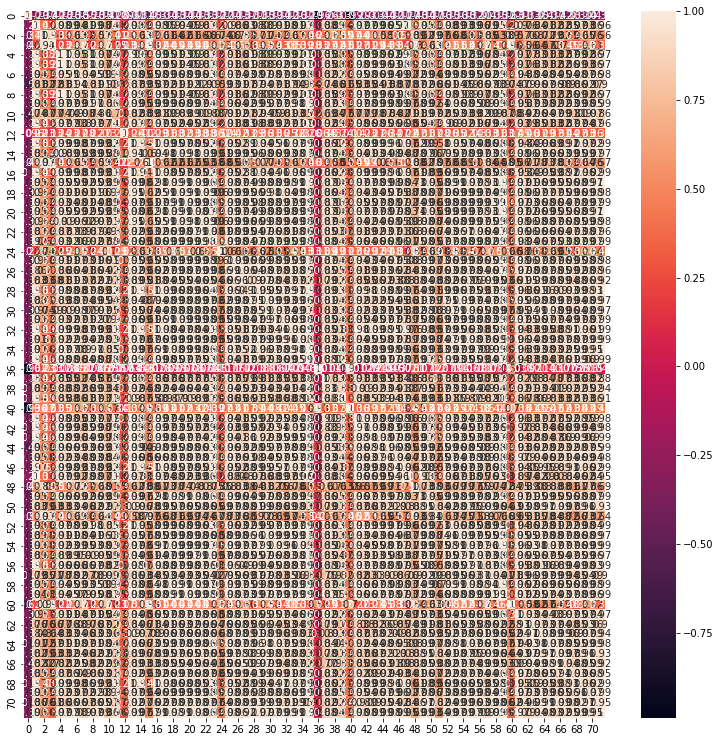

In [ ]:
df_7 = pd.DataFrame(observed_dirichlet_7)
corr_matrix_7 = df_7.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_7, annot=True)

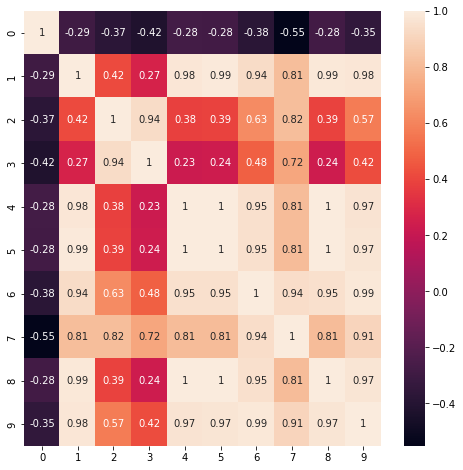

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_7 = corr_matrix_7.iloc[0:10,0:10]
sn.heatmap(corr_matrix_7, annot=True)
plt.show()

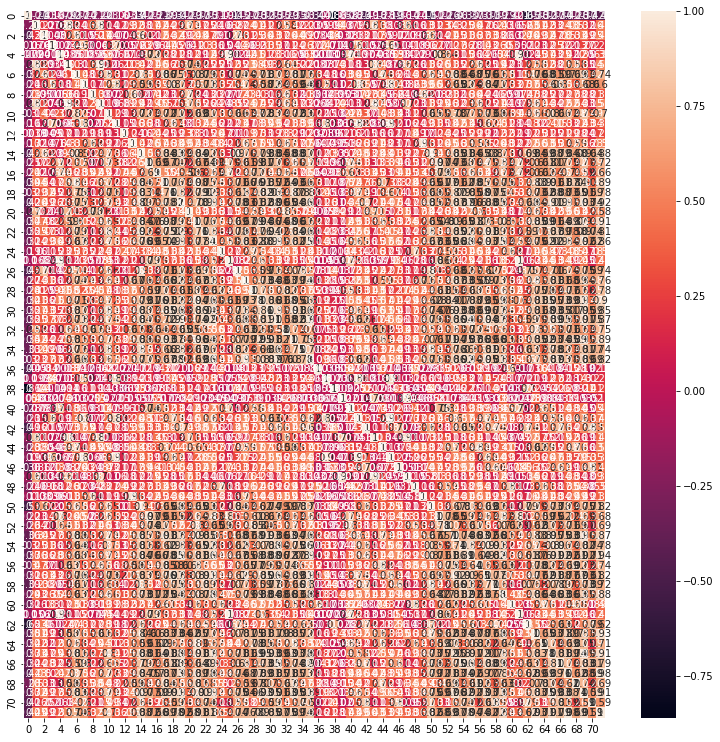

In [ ]:
df_8 = pd.DataFrame(observed_dirichlet_8)
corr_matrix_8 = df_8.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_8, annot=True)

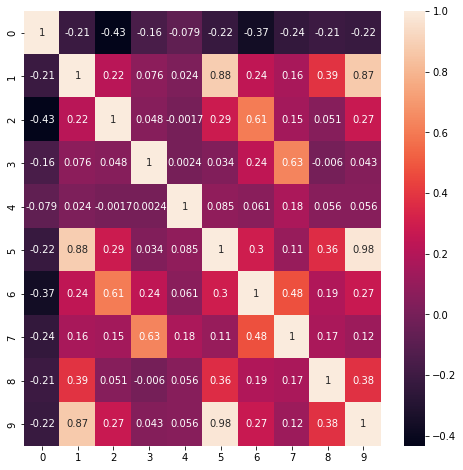

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_8 = corr_matrix_8.iloc[0:10,0:10]
sn.heatmap(corr_matrix_8, annot=True)
plt.show()

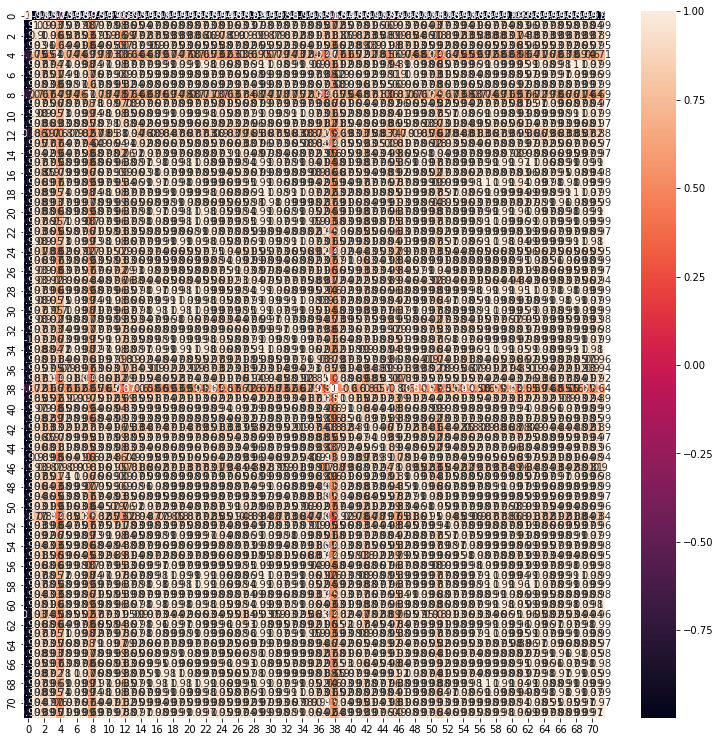

In [ ]:
df_9 = pd.DataFrame(observed_dirichlet_9)
corr_matrix_9 = df_9.corr()
plt.figure(figsize=(13,13))
sn.heatmap(corr_matrix_9, annot=True)

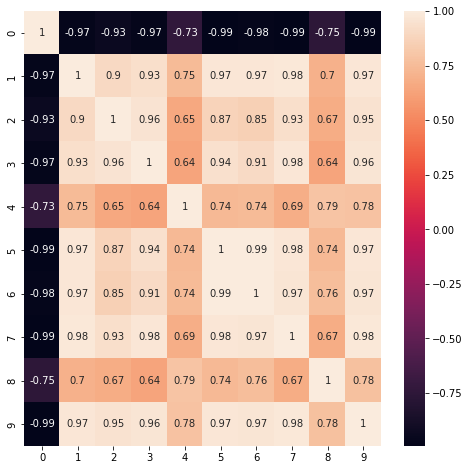

In [ ]:
plt.figure(figsize=(8,8))
corr_matrix_9 = corr_matrix_9.iloc[0:10,0:10]
sn.heatmap(corr_matrix_9, annot=True)
plt.show()